## Numerical Methods HW2

In [2]:
using DifferentialEquations, SpecialFunctions, LinearAlgebra, Plots,QuadGK,SphericalFunctions 
# I'm using plots instead of WGLMakie as I can't show my plots generated by WGLMakie in the PDF 

### Setting up the 2nd Order ODEs

Let us define the wave equation on a sphere using a modal decomposition in terms of 
spherical harmonics $( Y_l^m(\theta, \phi))$. The wave equation is expressed in terms of the 
mode coefficients $( c_{l,m}(t))$, leading to a system of second-order ordinary differential equations.

The scalar wave equation is given by:
    $
    \frac{\partial^2 \psi}{\partial t^2} = \nabla^2 \psi
    $

Expanding $\psi $  in spherical harmonics:
    $
    \psi(\theta, \phi, t) = \sum_{l=0}^{l_{\max}} \sum_{m=-l}^{l} c_{l,m}(t) Y_l^m(\theta, \phi)$

Substituting this expansion into the wave equation, we obtain the evolution equation for each mode:
    $
    \frac{d^2 c_{l,m}}{dt^2} = - l (l+1) c_{l,m}
    $
where $( -l(l+1) )$ are the eigenvalues of the Laplacian operator.

We split the second order equations into two sets of first order equations, $c_{l,m}$ and $\dot c _{l,m}$ and we store the coeffients in a vector A

A= $ [c_1,c_2 .... c_n, \dot c_1.... \dot c_n] $

Then, we solve the ODEs using 5th-order Runge Kutta solver for a test case.

In [3]:
lmax = 10; # maximum spherical harmonic degree 𝑙
lmodes = (lmax +1)^2 # Total number of spherical harmonic modes

#Eigenvalues of Laplacian Operator
Lp_eigen = []
for l in 0:lmax
    for m in -l:l
        eigenvalue = -l*(l+1)
        push!(Lp_eigen,eigenvalue)
    end
end
Lp_eigen;

In [4]:
# A matrix
function A_matrix!(dA, A, p, t)
    # p = all parameters to be paased like damping factors, eigenvalues
    # t= timespan , needed for ODE solver
    # Extract Laplacian eigenvalues from parameter vector
    Lp_eigen = p[1]  
    
    # Time derivatives
    n = length(A) ÷ 2  # There are n+n coefficients
    clm = A[1:n]       
    dtc_lm = A[n+1:end] 

    # First n: \dot c = existing velocity
    @. dA[1:n] = dtc_lm 

    # n to 2n: \dot \dot c = Laplacian * c
    @. dA[n+1:end] = Lp_eigen * clm  
end


A_matrix! (generic function with 1 method)

┌ Warning: Using arrays or dicts to store parameters of different types can hurt performance.
│ Consider using tuples instead.
└ @ SciMLBase ~/.julia/packages/SciMLBase/Pma4a/src/performance_warnings.jl:33


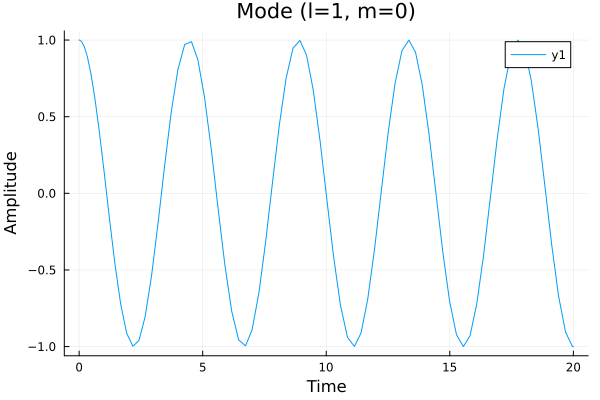

In [5]:
# Initialise arrays to store the clm and dtclm
c_i = zeros(Float64, lmodes)
dtc_i = zeros(Float64, lmodes)

# I got the code to check the example from Kiana, thanks!

# Example to check: excite the (l=1, m=0) mode
c_i[2] = 1.0  # Excite the (l=1, m=0) mode
u_i = vcat(c_i, dtc_i)  # Combine c_i and dtc_i into a single vector

# Define time span for ODE solver
tspan = (0.0, 20.0)  

# Define the ODE problem, passing Lp_eigen as a parameter
prob = ODEProblem(A_matrix!, u_i, tspan, [Lp_eigen])

# Runge Kutta solver
sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6)

# Plotting: Mode (l=1, m=0)
plot(sol.t, sol[2, :], xlabel="Time", ylabel="Amplitude", title="Mode (l=1, m=0)")



Now, we take the initial condition as a Gaussian function centered near the North Pole of the sphere. The Gaussian is defined as:

$
\text{Gaussian}(\theta) = \exp \left( - \frac{(\theta - \theta_0)^2}{2 \sigma^2} \right)
$
This Gaussian function is used to excite specific spherical harmonic modes.

Now, we expand the Gaussian function in terms of these spherical harmonics. The coefficient \( c_l^m \) for each mode is given by the integral:

$
c_l^m = \int_0^\pi \exp \left( - \frac{(\theta - \theta_0)^2}{2 \sigma^2} \right)(\theta) Y_l^m(\theta) \sin(\theta) d\theta
$

Then, we evolve the coefficients in time and use ODE solver and plot the results

In [6]:
# Gaussian function: returns the peak of the gaussian
sigma = 0.2  
# Gaussian Peak
function gaussian(theta)
    return exp(-((theta - 0.001)^2) / (2 * sigma^2))
end   

gaussian (generic function with 1 method)

In [7]:
# Computing the coefficients using Integrals

# I had to use ChatGPT to understand how to use sYlm_values and debug this

function coeffs(lmax)
    c_i = Float64[]  # Initialize an empty array for storing coefficients

    # Loop over all spherical harmonic degrees (l) and orders (m)
    for l in 0:lmax
        for m in -l:l
            if m == 0  # Only consider the m = 0 mode
              # Define spherical harmonic function Y_lm for m = 0, varying l
                Ylm = theta -> real(sYlm_values(theta, 0.0, l, m)[1])  # Real part of Y_lm

                # Define the integrand function
                integrand(theta) = gaussian(theta) * Ylm(theta) * sin(theta)

                # Compute the coefficient c_l using numerical integration (quadgk)
                c_l, _ = quadgk(integrand, 0, π)
                # Append the computed coefficient to the list
                push!(c_i, c_l)
            else
                push!(c_i,0)
            end
        end
    end

    return c_i  # Return the array of coefficients
end
#c_i = coeffs(lmax)
#length(c_i)

coeffs (generic function with 1 method)

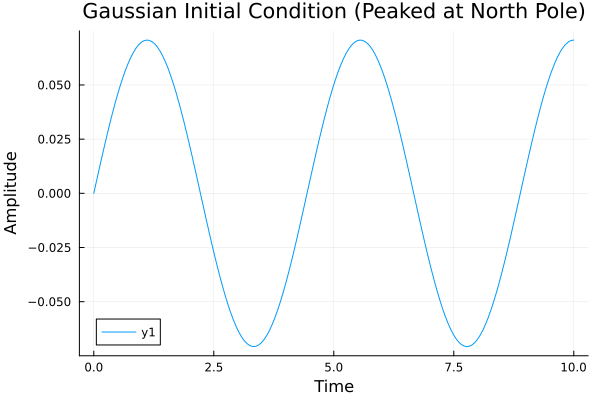

In [8]:
#example 
lmax = 10
lmodes = (lmax + 1)^2  # Total number of spherical harmonic modes

# Compute initial coefficients using the Gaussian peak function
c_i = coeffs(lmax)

# Initial conditions for the time derivatives (e.g., setting the 4th mode to some value)
dtc_i = zeros(Float64, lmodes)
dtc_i[4] = 0.1  # Excite the (l=1, m=0) mode

# Combine initial conditions into a single vector
u_i = vcat(c_i, dtc_i)  # Initial coefficients and their derivatives

# Time span for solving the ODE
tspan = (0.0, 10.0)

# Define the ODE problem, passing Lp_eigen as a parameter
prob = ODEProblem(A_matrix!, u_i, tspan, [Lp_eigen])

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6)

# Plot the solution for mode (l=1, m=0) (check the index)
plot(sol.t, sol[4, :], xlabel="Time", ylabel="Amplitude", 
     title="Gaussian Initial Condition (Peaked at North Pole)")


Now, we discretize the sphere into a mesh

To represent a sphere in 3D, we use spherical coordinates:
- $ \theta$ (colatitude): Varies from  $0$  to $\pi $.
- $ \phi$  (longitude): Varies from $0$  to $2\pi $.

The Cartesian coordinates \((x, y, z)\) corresponding to these spherical coordinates are computed as:

$
x = sin(\theta) cos(\phi)
$

$
y = sin(\theta) sin(\phi)$

$
z = cos(\theta)
$

Next, we generate the mesh using range for $\theta$ and $\phi$, then compute the corresponding Cartesian coordinates.

In [9]:
# Define the ranges for theta (colatitude) and phi (longitude)
theta = range(0, π, length=100);
phi = range(0, 2π, length=100);

# Create the mesh grid for theta and phi
THETA = repeat(theta', length(phi), 1);  # Repeat theta along rows
PHI = repeat(phi, 1, length(theta));     # Repeat phi along columns


100×100 Matrix{Float64}:
 0.0        0.0        0.0        …  0.0        0.0        0.0
 0.0634665  0.0634665  0.0634665     0.0634665  0.0634665  0.0634665
 0.126933   0.126933   0.126933      0.126933   0.126933   0.126933
 0.1904     0.1904     0.1904        0.1904     0.1904     0.1904
 0.253866   0.253866   0.253866      0.253866   0.253866   0.253866
 0.317333   0.317333   0.317333   …  0.317333   0.317333   0.317333
 0.380799   0.380799   0.380799      0.380799   0.380799   0.380799
 0.444266   0.444266   0.444266      0.444266   0.444266   0.444266
 0.507732   0.507732   0.507732      0.507732   0.507732   0.507732
 0.571199   0.571199   0.571199      0.571199   0.571199   0.571199
 0.634665   0.634665   0.634665   …  0.634665   0.634665   0.634665
 0.698132   0.698132   0.698132      0.698132   0.698132   0.698132
 0.761598   0.761598   0.761598      0.761598   0.761598   0.761598
 ⋮                                ⋱                        
 5.58505    5.58505    5.58505       

Let us visualise how the mesh looks like 

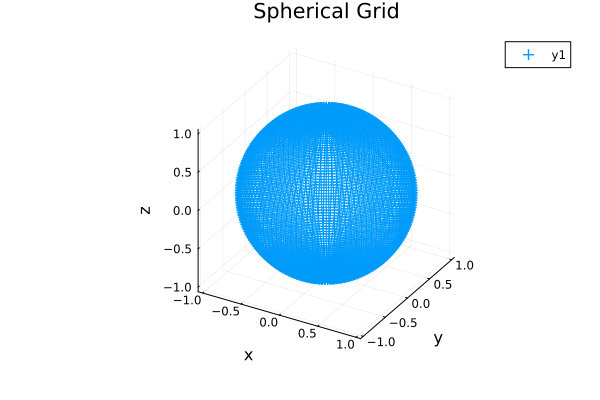

In [13]:
# Visualising the Mesh 

#Initialize arrays to store coordinates
x = Float64[]
y = Float64[]
z = Float64[]

# Generate the mesh points
for th in theta
    for fi in phi
        push!(x, sin(th) * cos(fi))
        push!(y, sin(th) * sin(fi))
        push!(z, cos(th))
    end
end

# Plotting the mesh on the sphere
scatter3d(x, y, z, marker = (:auto, 3), xlabel = "x", ylabel = "y", zlabel = "z", title = "Spherical Grid")

### Reconstructing the Scalar Field from Spherical Harmonic Coefficients
The scalar field $\psi$  is reconstructed from the expansion:

$
\psi(\theta, \phi, t) = \sum_{l=0}^{l_{\text{max}}} \sum_{m=-l}^{l} c_{lm}(t) Y_{lm}(\theta, \phi)
$
The function psi_recon takes the solution sol, a time index t_idx, and the angular grid $(\theta, \phi)$ to reconstruct the field.

In [14]:
# Reconstruct the field from the solution coefficients
function psi_recon(sol, t_idx, lmax, THETA, PHI)
    psi = zeros(size(THETA))  # Initialize the field with zeros
    index = 1
    
    for l in 0:lmax
        for m in -l:l
            # Compute the real spherical harmonics on the grid
            Ylm_vals = [real(sYlm_values(THETA[i, j], PHI[i, j], l, m)[1]) for i in 1:size(THETA, 1), j in 1:size(THETA, 2)]
            
            # Get the corresponding coefficient from the solution
            c_lm = sol[index, t_idx]
            
            # Sum over modes
            @. psi += c_lm * Ylm_vals  
            
            index += 1
        end
    end
    return psi
end


psi_recon (generic function with 1 method)

### Animation
I generated the code for animation from ChatGPT, I can't seem to see a difference in the animation for different lmax but I am not sure why

[ Info: Saved animation to /mnt/c/Users/janan/wave_evolution_l_10.gif


Plots.AnimatedGif("/mnt/c/Users/janan/wave_evolution_l_10.gif")
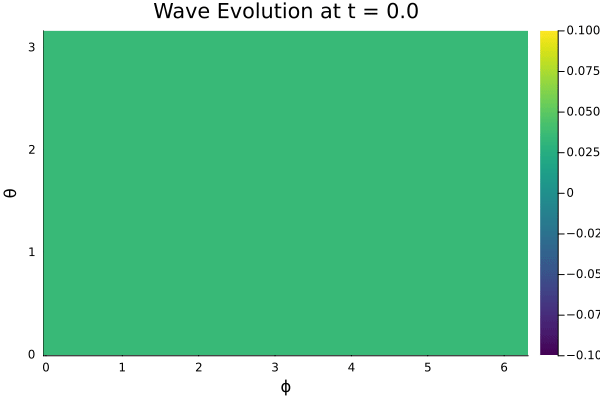

In [27]:
l_max = 10
anim = @animate for t_idx in 1:10:length(sol.t)
    ϕ_field = psi_recon(sol, t_idx,l_max,THETA,PHI)
    heatmap(phi, theta, ϕ_field, c=:viridis, 
            title="Wave Evolution at t = $(round(sol.t[t_idx], digits=2))",
            xlabel="ϕ", ylabel="θ", clims=(-0.1, 0.1))
end

# Save the animation as a GIF
gif(anim, "wave_evolution_l_10.gif", fps=10)

[ Info: Saved animation to /mnt/c/Users/janan/wave_evolution_l_5.gif


Plots.AnimatedGif("/mnt/c/Users/janan/wave_evolution_l_5.gif")
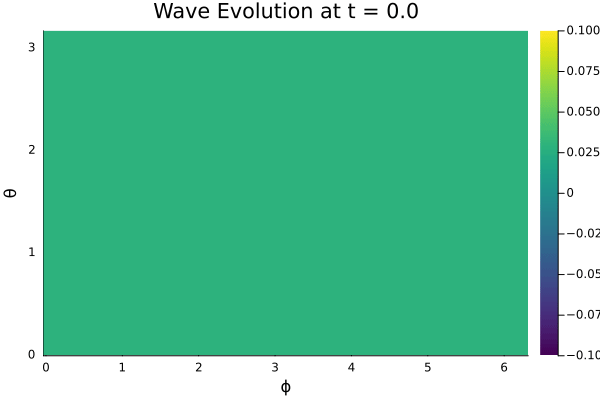

In [28]:
l_max=8
anim = @animate for t_idx in 1:10:length(sol.t)
    ϕ_field = psi_recon(sol, t_idx,8,THETA,PHI)
    
    heatmap(phi, theta, ϕ_field, c=:viridis, 
            title="Wave Evolution at t = $(round(sol.t[t_idx], digits=2))",
            xlabel="ϕ", ylabel="θ", clims=(-0.1, 0.1))
end

# Save the animation as a GIF
gif(anim, "wave_evolution_l_5.gif", fps=10)

[ Info: Saved animation to /mnt/c/Users/janan/wave_evolution_l_12.gif


Plots.AnimatedGif("/mnt/c/Users/janan/wave_evolution_l_12.gif")
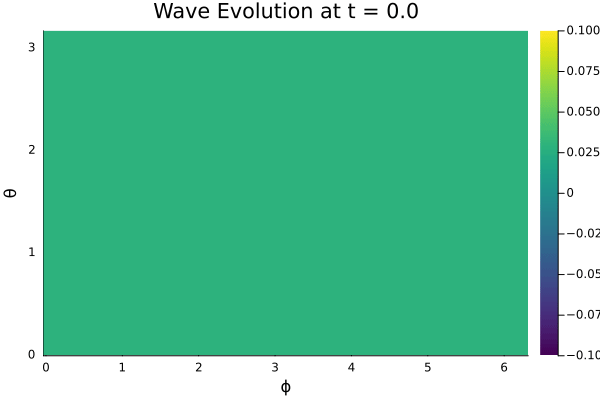

In [29]:
l_max=12
anim = @animate for t_idx in 1:10:length(sol.t)
    ϕ_field = psi_recon(sol, t_idx,8,THETA,PHI)
    heatmap(phi, theta, ϕ_field, c=:viridis, 
            title="Wave Evolution at t = $(round(sol.t[t_idx], digits=2))",
            xlabel="ϕ", ylabel="θ", clims=(-0.1, 0.1))
end

# Save the animation as a GIF
gif(anim, "wave_evolution_l_12.gif", fps=10)

[ Info: Saved animation to /mnt/c/Users/janan/wave_evolution_l_15.gif


Plots.AnimatedGif("/mnt/c/Users/janan/wave_evolution_l_15.gif")
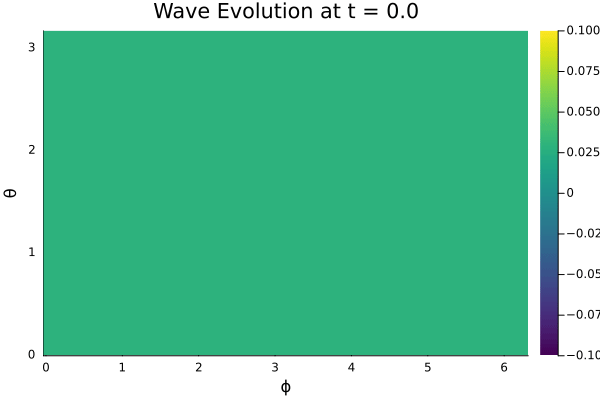

In [30]:
l_max=15
anim = @animate for t_idx in 1:10:length(sol.t)
    ϕ_field = psi_recon(sol, t_idx,8,THETA,PHI)
    heatmap(phi, theta, ϕ_field, c=:viridis, 
            title="Wave Evolution at t = $(round(sol.t[t_idx], digits=2))",
            xlabel="ϕ", ylabel="θ", clims=(-0.1, 0.1))
end

# Save the animation as a GIF
gif(anim, "wave_evolution_l_15.gif", fps=10)